In [1]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
np.random.seed(2)
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from io import StringIO
from matplotlib.pyplot import imread
import cv2
import scipy.misc
import imageio
import skimage
import skimage.color


In [3]:
import io
from io import StringIO
import string
import pandas as pd
from collections import Counter


In [4]:
from keras.utils.np_utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense, Flatten, Conv2D, MaxPool2D, Dropout
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from numpy import expand_dims
from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array

In [5]:
from keras.callbacks import EarlyStopping

In [6]:
from PIL import Image, ImageChops, ImageEnhance
import os
import itertools

In [7]:
def convert_to_ela_image(path, quality):
    temp_filename = 'temp_file_name.jpg'
    ela_filename = 'temp_ela.png'
    
    image = Image.open(path).convert('RGB')
    image.save(temp_filename, 'JPEG', quality = quality)
    temp_image = Image.open(temp_filename)
    
    ela_image = ImageChops.difference(image, temp_image)
    
    extrema = ela_image.getextrema()
    max_diff = max([ex[1] for ex in extrema])
    if max_diff == 0:
        max_diff = 1
    scale = 255.0 / max_diff
    
    ela_image = ImageEnhance.Brightness(ela_image).enhance(scale)
    
    return ela_image

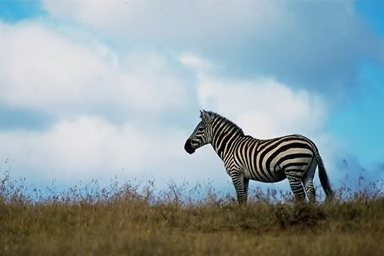

In [9]:
real_image_path = '../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg'
Image.open(real_image_path)

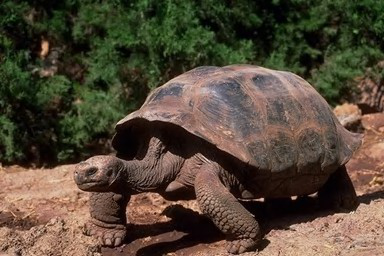

In [12]:
real_image1_path = '/kaggle/input/casia-dataset/CASIA1/Au/Au_ani_0003.jpg'
Image.open(real_image1_path)

Image data preprocessing for real image

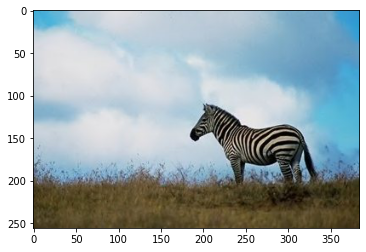

In [86]:
image = imageio.imread('../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg')
i, (im1) = plt.subplots(1)
i.set_figwidth(15)
im1.imshow(image)


RGB Channels

Text(0.5, 0.98, 'Original & RGB image channels')

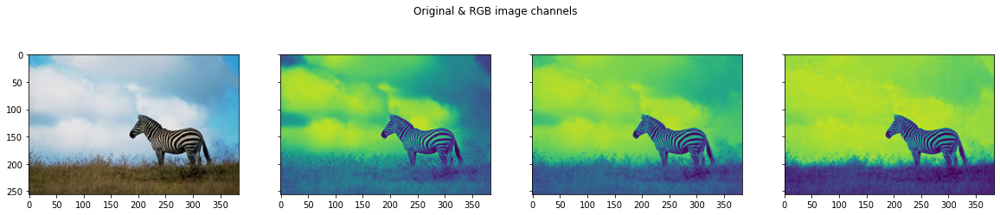

In [87]:
i, (im1, im2, im3, im4) = plt.subplots(1, 4, sharey=True)
i.set_figwidth(20) 

im1.imshow(image)  #Original image
im2.imshow(image[:, : , 0]) #Red
im3.imshow(image[:, : , 1]) #Green
im4.imshow(image[:, : , 2]) #Blue
i.suptitle('Original & RGB image channels')

1. Grayscale conversion

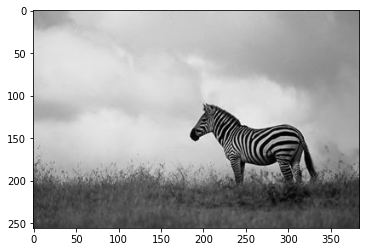

In [88]:
gray_image = skimage.color.rgb2gray(image)
plt.imshow(gray_image, cmap = 'gray')

2. Normalization

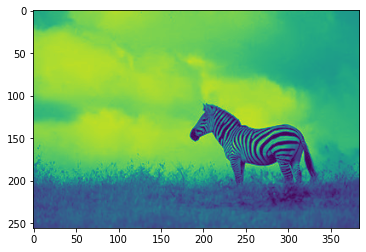

In [89]:
norm_image = (gray_image - np.min(gray_image)) / (np.max(gray_image) - np.min(gray_image))
plt.imshow(norm_image)

3. Shifting

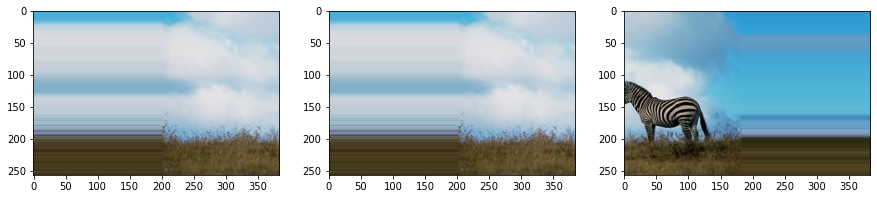

In [92]:
data = img_to_array(image)

samples = expand_dims(image, 0)

datagen = ImageDataGenerator(width_shift_range=[-200,200])

it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

4. Flipping

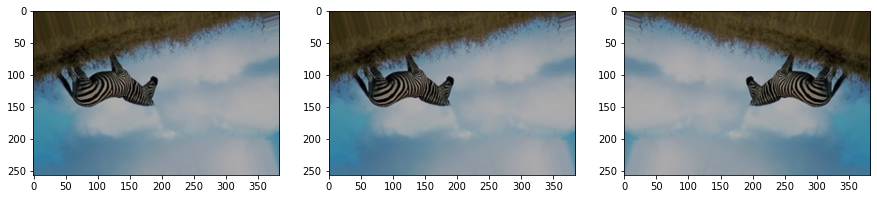

In [100]:
data = img_to_array(image)

samples = expand_dims(image, 0)
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

5. Rotation

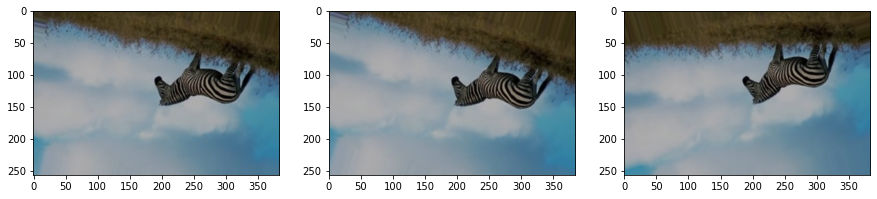

In [101]:
data = img_to_array(image)

samples = expand_dims(image, 0)

datagen = ImageDataGenerator(rotation_range=20, fill_mode='nearest')

it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

6. Changing Brightness

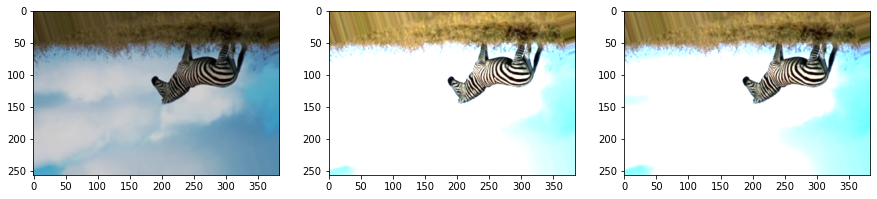

In [102]:
data = img_to_array(image)

samples = expand_dims(image, 0)

datagen = ImageDataGenerator(brightness_range=[0.5,2.0])

it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

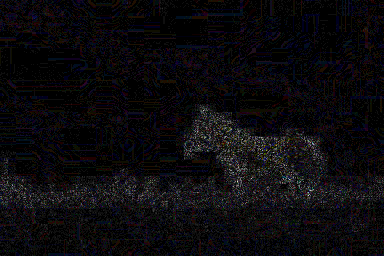

In [7]:
convert_to_ela_image(real_image_path, 90)

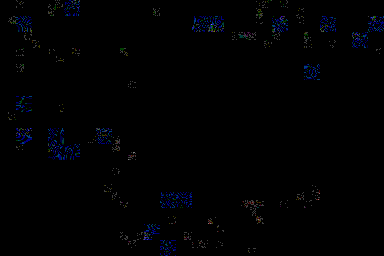

In [13]:
convert_to_ela_image(real_image1_path, 90)

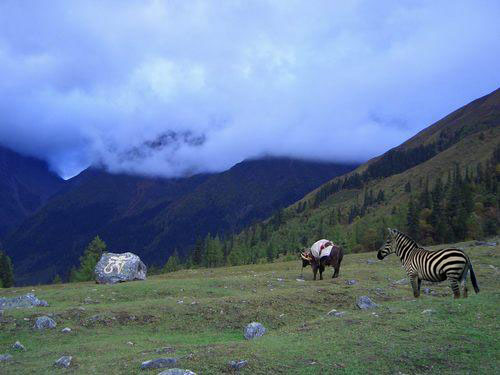

In [15]:
fake_image_path = '../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
Image.open(fake_image_path)

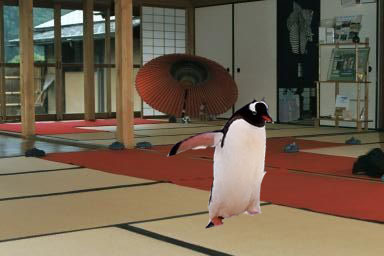

In [16]:
fake_image1_path = '/kaggle/input/casia-dataset/CASIA1/Sp/Sp_D_CNN_A_art0024_ani0032_0268.jpg'
Image.open(fake_image1_path)

Image data Preprocessing for fake image

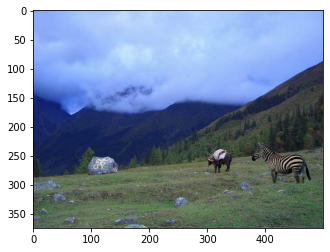

In [28]:
image = imageio.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
i, (im1) = plt.subplots(1)
i.set_figwidth(15)
im1.imshow(image)

RGB Channels

Text(0.5, 0.98, 'Original & RGB image channels')

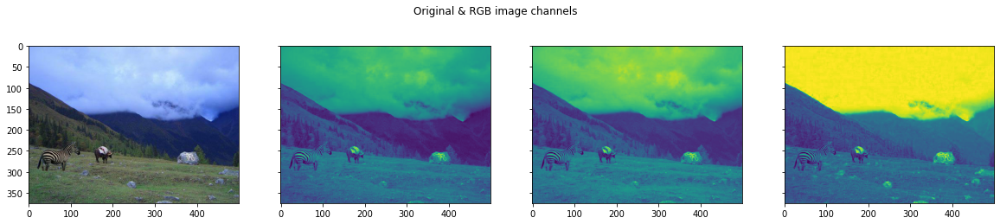

In [25]:
i, (im1, im2, im3, im4) = plt.subplots(1, 4, sharey=True)
i.set_figwidth(20) 

im1.imshow(image)  #Original image
im2.imshow(image[:, : , 0]) #Red
im3.imshow(image[:, : , 1]) #Green
im4.imshow(image[:, : , 2]) #Blue
i.suptitle('Original & RGB image channels')

1. Grayscale conversion

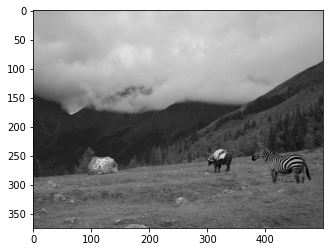

In [14]:
gray_image = skimage.color.rgb2gray(image)
plt.imshow(gray_image, cmap = 'gray')

2. Normalization

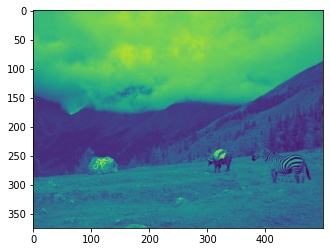

In [29]:
norm_image = (gray_image - np.min(gray_image)) / (np.max(gray_image) - np.min(gray_image))
plt.imshow(norm_image)

3. Shifting

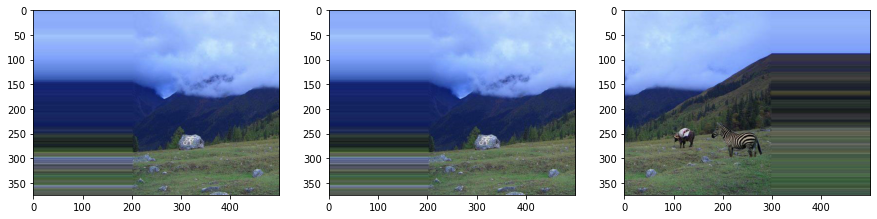

In [16]:
data = img_to_array(image)

samples = expand_dims(image, 0)

datagen = ImageDataGenerator(width_shift_range=[-200,200])

it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

Flipping

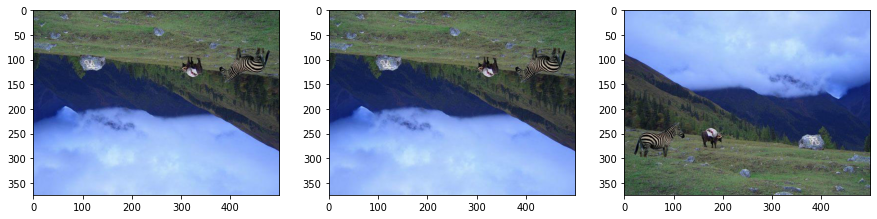

In [24]:
data = img_to_array(image)

samples = expand_dims(image, 0)
datagen = ImageDataGenerator(horizontal_flip=True, vertical_flip=True)
it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

5. Rotation

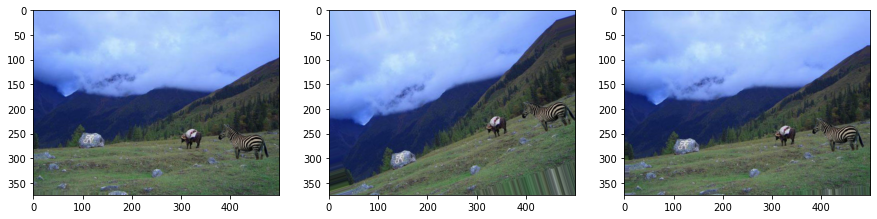

In [27]:
data = img_to_array(image)

samples = expand_dims(image, 0)

datagen = ImageDataGenerator(rotation_range=20, fill_mode='nearest')

it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

6. Changing brightness

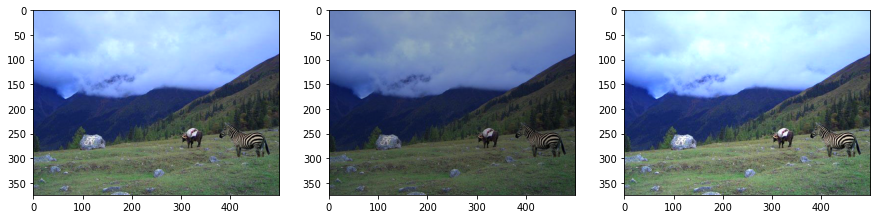

In [22]:
data = img_to_array(image)

samples = expand_dims(image, 0)

datagen = ImageDataGenerator(brightness_range=[0.5,2.0])

it = datagen.flow(samples, batch_size=1)
fig, im = plt.subplots(nrows=1, ncols=3, figsize=(15,15))

for i in range(3):

    image = next(it)[0].astype('uint8')
 
    im[i].imshow(image)

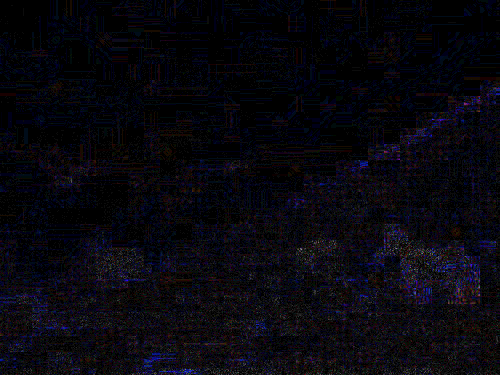

In [9]:
convert_to_ela_image(fake_image_path, 90)

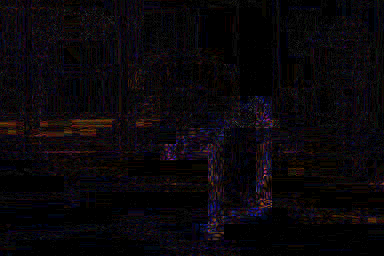

In [17]:
convert_to_ela_image(fake_image1_path, 90)

In [10]:
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise

import skimage.io

img_r=skimage.io.imread('../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg')
img_r=skimage.img_as_float(img_r) 

sigma_est=estimate_sigma(img_r,multichannel=True,average_sigmas=True)  

img_bayes=denoise_wavelet(img_r,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

img_visushrink=denoise_wavelet(img_r,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
                               wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


/opt/conda/lib/python3.7/site-packages/pywt/_multilevel.py:45: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.

  "boundary effects.").format(level))


In [18]:
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise

import skimage.io

img_r1=skimage.io.imread('/kaggle/input/casia-dataset/CASIA1/Au/Au_ani_0003.jpg')
img_r1=skimage.img_as_float(img_r1) 

sigma_est=estimate_sigma(img_r1,multichannel=True,average_sigmas=True)  

img_bayes=denoise_wavelet(img_r1,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

img_visushrink=denoise_wavelet(img_r1,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
                               wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


/opt/conda/lib/python3.7/site-packages/pywt/_multilevel.py:45: UserWarning: Level value of 5 is too high: all coefficients will experience boundary effects.
  "boundary effects.").format(level))


In [11]:
import cv2
psnr_noisy = cv2.PSNR(img_r,img_r)
psnr_noisy

361.20199909921956

In [19]:
import cv2
psnr_noisy = cv2.PSNR(img_r1,img_r1)
psnr_noisy

361.20199909921956

In [12]:
psnr_bayes = cv2.PSNR(img_r,img_bayes)
psnr_bayes

124.60573219905689

In [20]:
psnr_bayes = cv2.PSNR(img_r1,img_bayes)
psnr_bayes

101.0945945601465

In [13]:
psnr_visu = cv2.PSNR(img_r,img_visushrink)
psnr_bayes

124.60573219905689

In [21]:
psnr_visu = cv2.PSNR(img_r1,img_visushrink)
psnr_bayes

101.0945945601465

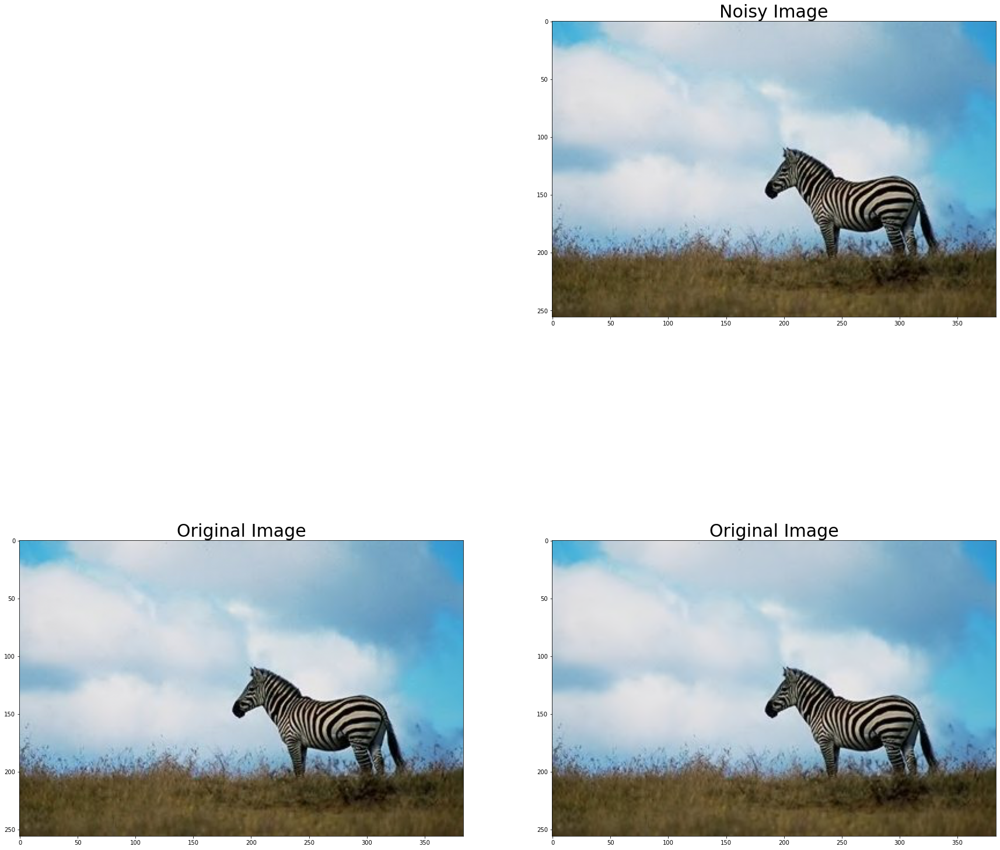

In [14]:
plt.figure(figsize=(30,30))

plt.subplot(2,2,2)
plt.imshow(img_r,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

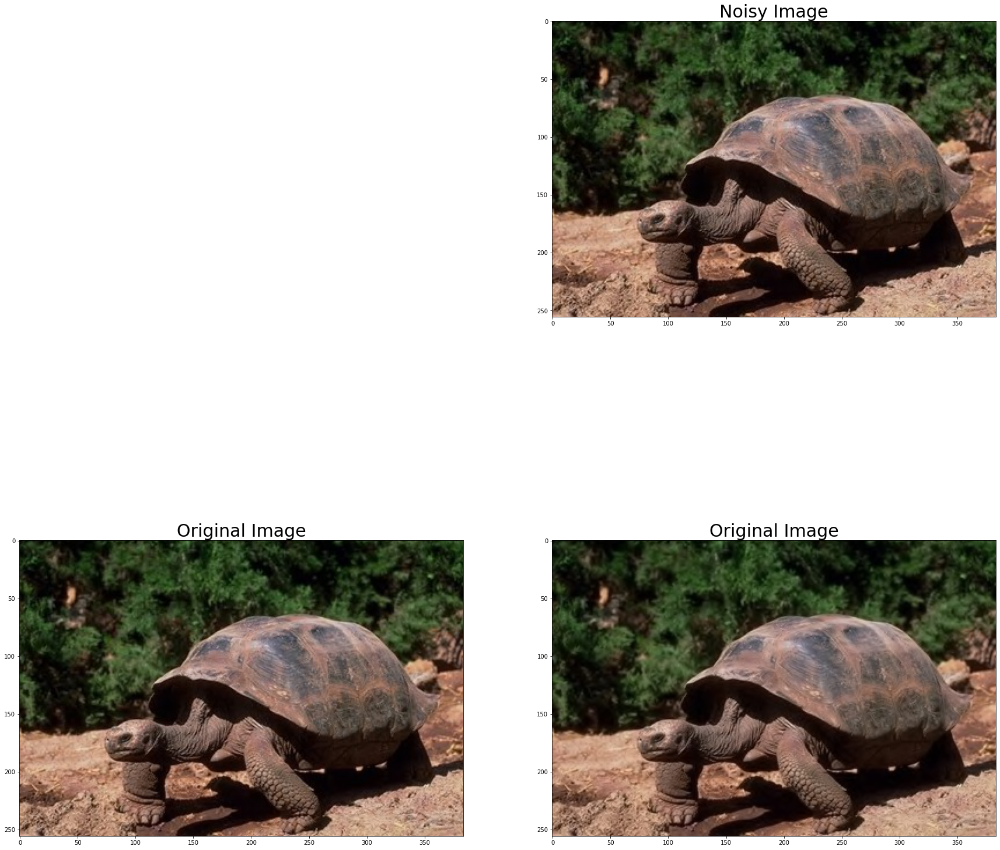

In [22]:
plt.figure(figsize=(30,30))

plt.subplot(2,2,2)
plt.imshow(img_r1,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [15]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)


PSNR[Original vs. Noisy Image] 361.20199909921956

PSNR[Original vs. Denoised(VisuShrink)] 100.08271190521796

PSNR[Original vs. Denoised(Bayes)] 124.60573219905689


In [23]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)


PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 85.57071825767451
PSNR[Original vs. Denoised(Bayes)] 101.0945945601465


In [16]:
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise

import skimage.io

img_f=skimage.io.imread('../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg')
img_f=skimage.img_as_float(img_f)

sigma_est=estimate_sigma(img_f,multichannel=True,average_sigmas=True)  #Noise estimation

img_bayes=denoise_wavelet(img_f,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

img_visushrink=denoise_wavelet(img_f,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
                               wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


In [24]:
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise

import skimage.io

img_f1=skimage.io.imread('/kaggle/input/casia-dataset/CASIA1/Sp/Sp_D_CNN_A_art0024_ani0032_0268.jpg')
img_f1=skimage.img_as_float(img_f1)

sigma_est=estimate_sigma(img_f1,multichannel=True,average_sigmas=True)  #Noise estimation

img_bayes=denoise_wavelet(img_f1,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

img_visushrink=denoise_wavelet(img_f1,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
                               wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)


In [17]:
import cv2
psnr_noisy = cv2.PSNR(img_f,img_f)
psnr_noisy

361.20199909921956

In [25]:
import cv2
psnr_noisy = cv2.PSNR(img_f1,img_f1)
psnr_noisy

361.20199909921956

In [18]:
psnr_bayes = cv2.PSNR(img_f,img_bayes)
psnr_bayes

120.58626094108678

In [26]:
psnr_bayes = cv2.PSNR(img_f1,img_bayes)
psnr_bayes

122.12908082578022

In [19]:
psnr_visu = cv2.PSNR(img_f,img_visushrink)
psnr_bayes

120.58626094108678

In [27]:
psnr_visu = cv2.PSNR(img_f1,img_visushrink)
psnr_bayes

122.12908082578022

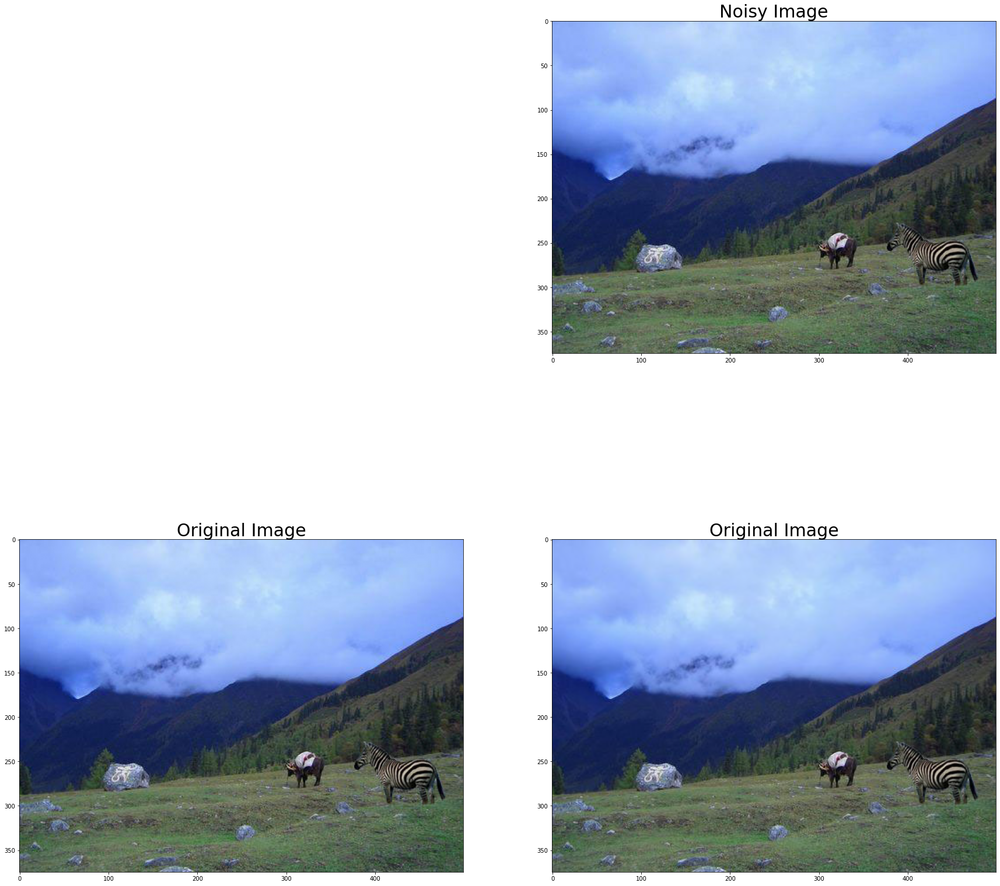

In [20]:
plt.figure(figsize=(30,30))

plt.subplot(2,2,2)
plt.imshow(img_f,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

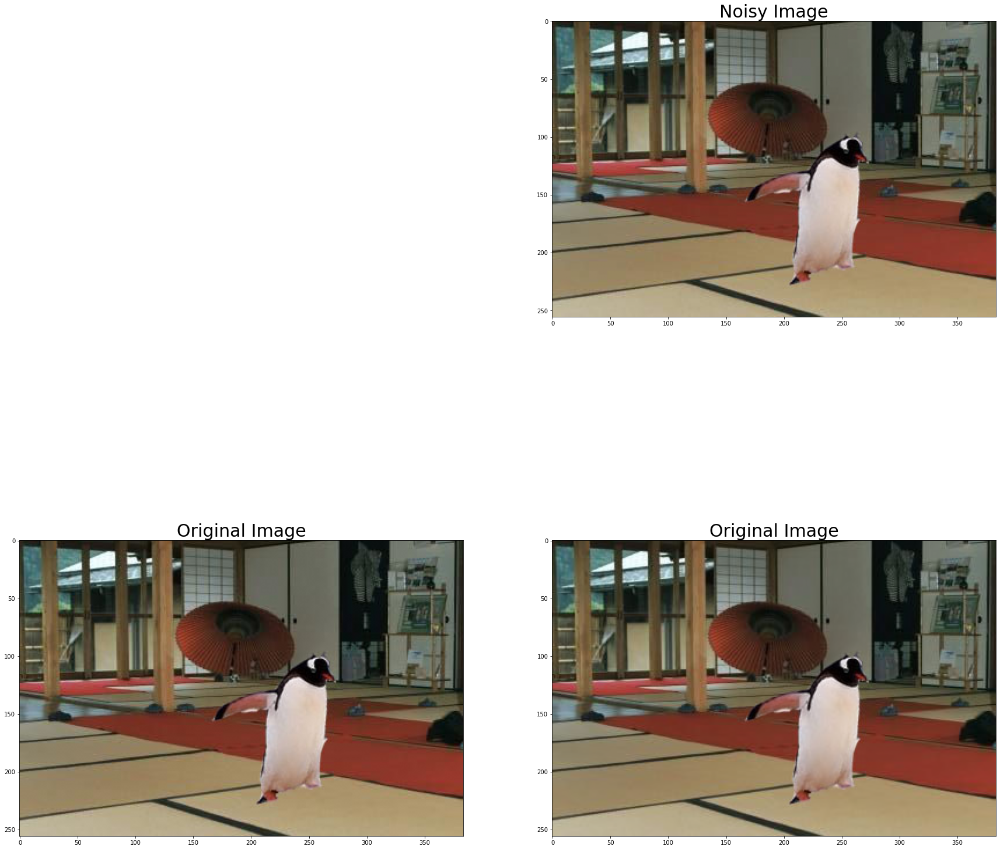

In [28]:
plt.figure(figsize=(30,30))

plt.subplot(2,2,2)
plt.imshow(img_f1,cmap=plt.cm.gray)
plt.title('Noisy Image',fontsize=30)

plt.subplot(2,2,3)
plt.imshow(img_bayes,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.subplot(2,2,4)
plt.imshow(img_visushrink,cmap=plt.cm.gray)
plt.title('Original Image',fontsize=30)

plt.show()

In [21]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956

PSNR[Original vs. Denoised(VisuShrink)] 97.24783471476827

PSNR[Original vs. Denoised(Bayes)] 120.58626094108678


In [29]:
print('PSNR[Original vs. Noisy Image]', psnr_noisy)
print('PSNR[Original vs. Denoised(VisuShrink)]', psnr_visu)
print('PSNR[Original vs. Denoised(Bayes)]', psnr_bayes)

PSNR[Original vs. Noisy Image] 361.20199909921956
PSNR[Original vs. Denoised(VisuShrink)] 99.52026586147063
PSNR[Original vs. Denoised(Bayes)] 122.12908082578022


In [30]:
from skimage.restoration import (denoise_wavelet,estimate_sigma)
from skimage.util import random_noise

import skimage.io

In [23]:
def denoise_img(img):
    
    img=skimage.img_as_float(img_f) 


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes 


In [31]:
def denoise_img(img):
    
    img=skimage.img_as_float(img_f1) 


    sigma_est=estimate_sigma(img,multichannel=True,average_sigmas=True)  #Noise estimation

    img_bayes=denoise_wavelet(img,method='BayesShrink',mode='soft',wavelet_levels=3,
                          wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)

    img_visushrink=denoise_wavelet(img,method='VisuShrink',mode='soft',sigma=sigma_est/3,wavelet_levels=5,
    wavelet='coif5',multichannel=True,convert2ycbcr=True,rescale_sigma=True)
    return img_bayes 

In [32]:
image_size = (128, 128)

In [33]:
def prepare_image(image_path):
    return np.array(convert_to_ela_image(image_path, 90).resize(image_size)).flatten() / 255.0

In [48]:
X = [] 
Y = [] 

In [50]:
X1=[]
Y1=[]

In [27]:
import random
path = '../input/casia-dataset/CASIA2/Au/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(1)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

random.shuffle(X)
X = X[:2100]
Y = Y[:2100]
print(len(X), len(Y))

Processing 500 images

Processing 1000 images

Processing 1500 images

Processing 2000 images


/opt/conda/lib/python3.7/site-packages/PIL/TiffImagePlugin.py:766: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 2. Skipping tag 41487

  " Skipping tag %s" % (size, len(data), tag)

/opt/conda/lib/python3.7/site-packages/PIL/TiffImagePlugin.py:766: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 41988

  " Skipping tag %s" % (size, len(data), tag)


Processing 2500 images

Processing 3000 images

Processing 3500 images

Processing 4000 images

Processing 4500 images

Processing 5000 images

Processing 5500 images

Processing 6000 images

Processing 6500 images

Processing 7000 images

2100 2100


In [51]:
import random
path = '../input/casia-dataset/CASIA1/Au/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X1.append(prepare_image(full_path))
            Y1.append(1)
            if len(Y1) % 500 == 0:
                print(f'Processing {len(Y1)} images')

random.shuffle(X1)
print(len(X1), len(Y1))

Processing 500 images
790 790


In [49]:
path = '../input/casia-dataset/CASIA2/Tp/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X.append(prepare_image(full_path))
            Y.append(0)
            if len(Y) % 500 == 0:
                print(f'Processing {len(Y)} images')

print(len(X), len(Y))

Processing 500 images
Processing 1000 images
Processing 1500 images
Processing 2000 images
2064 2064


In [52]:
path = '../input/casia-dataset/CASIA1/Sp/'
for dirname, _, filenames in os.walk(path):
    for filename in filenames:
        if filename.endswith('jpg') or filename.endswith('png'):
            full_path = os.path.join(dirname, filename)
            X1.append(prepare_image(full_path))
            Y1.append(0)
            if len(Y1) % 500 == 0:
                print(f'Processing {len(Y1)} images')

print(len(X1), len(Y1))

Processing 1000 images
Processing 1500 images
1711 1711


In [42]:
import numpy as np
X = np.array(X)
Y = to_categorical(Y, 2)
X = X.reshape(-1, 128, 128, 3)

In [53]:
import numpy as np
X1 = np.array(X1)
Y1 = to_categorical(Y1, 2)
X1 = X1.reshape(-1, 128, 128, 3)

In [30]:
X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size = 0.2, random_state=5)
X = X.reshape(-1,1,1,1)
print(len(X_train), len(Y_train))
print(len(X_val), len(Y_val))

3331 3331

833 833


In [54]:
X1_train, X1_val, Y1_train, Y1_val = train_test_split(X1, Y1, test_size = 0.2, random_state=5)
X1 = X1.reshape(-1,1,1,1)
print(len(X1_train), len(Y1_train))
print(len(X1_val), len(Y1_val))

1368 1368
343 343


In [55]:
def build_model():
    model = Sequential()
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(Conv2D(filters = 32, kernel_size = (5, 5), padding = 'valid', activation = 'relu', input_shape = (128, 128, 3)))
    model.add(MaxPool2D(pool_size = (2, 2)))
    model.add(Dropout(0.25))
    model.add(Flatten())
    model.add(Dense(256, activation = 'relu'))
    model.add(Dropout(0.5))
    model.add(Dense(2, activation = 'softmax'))
    return model

In [56]:
model = build_model()
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 124, 124, 32)      2432      
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 120, 120, 32)      25632     
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 60, 60, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 60, 60, 32)        0         
_________________________________________________________________
flatten (Flatten)            (None, 115200)            0         
_________________________________________________________________
dense (Dense)                (None, 256)               29491456  
_________________________________________________________________
dropout_1 (Dropout)          (None, 256)               0

In [57]:
from keras import optimizers
model.compile(loss='categorical_crossentropy', optimizer='Nadam', metrics=['accuracy'])



In [58]:
epochs = 20
batch_size = 32

In [35]:
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
x_train2 = np.array(X_train, copy=True) 
y_train2 = np.array(Y_train, copy=True) 

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split = 0.2
    )

datagen.fit(X_train)

print(type(X_train))

early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=0, mode='min')

validation_generator = datagen.flow(x_train2, y_train2, batch_size=32, subset='validation')
train_generator = datagen.flow(x_train2, y_train2,batch_size=32, subset='training')

history = model.fit_generator(train_generator, epochs=epochs, validation_data = (X_val,Y_val), verbose = 1,callbacks = [early_stopping])

<class 'numpy.ndarray'>


/opt/conda/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.

  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20

84/84 [==============================] - 22s 172ms/step - loss: 3.1882 - accuracy: 0.5918 - val_loss: 0.6800 - val_accuracy: 0.5198

Epoch 2/20

84/84 [==============================] - 14s 164ms/step - loss: 0.5932 - accuracy: 0.7443 - val_loss: 0.7563 - val_accuracy: 0.4886

Epoch 3/20

84/84 [==============================] - 14s 172ms/step - loss: 0.6012 - accuracy: 0.7703 - val_loss: 0.7099 - val_accuracy: 0.4886

Epoch 4/20

84/84 [==============================] - 14s 163ms/step - loss: 0.4856 - accuracy: 0.8169 - val_loss: 0.7593 - val_accuracy: 0.4886

Epoch 5/20

84/84 [==============================] - 15s 172ms/step - loss: 0.6509 - accuracy: 0.8453 - val_loss: 0.8163 - val_accuracy: 0.4886

Epoch 6/20

84/84 [==============================] - 14s 164ms/step - loss: 0.2989 - accuracy: 0.8933 - val_loss: 0.7818 - val_accuracy: 0.4886

Epoch 7/20

84/84 [==============================] - 15s 173ms/step - loss: 0.2965 - accuracy: 0.8885 - val_loss: 0.8201 - val_acc

In [59]:
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ModelCheckpoint, EarlyStopping
x1_train2 = np.array(X1_train, copy=True) 
y1_train2 = np.array(Y1_train, copy=True) 

datagen = ImageDataGenerator(
    featurewise_center=True,
    featurewise_std_normalization=True,
    rotation_range=10,
    fill_mode='nearest',
    validation_split = 0.2
    )

datagen.fit(X1_train)

print(type(X1_train))

early_stopping = keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=30, verbose=0, mode='min')

validation_generator = datagen.flow(x1_train2, y1_train2, batch_size=32, subset='validation')
train_generator = datagen.flow(x1_train2, y1_train2,batch_size=32, subset='training')

history = model.fit_generator(train_generator, epochs=epochs, validation_data = (X1_val,Y1_val), verbose = 1,callbacks = [early_stopping])

<class 'numpy.ndarray'>


/opt/conda/lib/python3.7/site-packages/tensorflow/python/keras/engine/training.py:1844: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/20
35/35 [==============================] - 18s 182ms/step - loss: 4.2450 - accuracy: 0.5175 - val_loss: 0.6925 - val_accuracy: 0.5656
Epoch 2/20
35/35 [==============================] - 5s 153ms/step - loss: 0.6653 - accuracy: 0.5826 - val_loss: 0.6901 - val_accuracy: 0.5656
Epoch 3/20
35/35 [==============================] - 5s 152ms/step - loss: 0.6205 - accuracy: 0.6819 - val_loss: 0.6899 - val_accuracy: 0.5656
Epoch 4/20
35/35 [==============================] - 5s 152ms/step - loss: 0.6024 - accuracy: 0.7165 - val_loss: 0.6896 - val_accuracy: 0.5656
Epoch 5/20
35/35 [==============================] - 6s 160ms/step - loss: 0.5409 - accuracy: 0.7532 - val_loss: 0.6883 - val_accuracy: 0.5656
Epoch 6/20
35/35 [==============================] - 5s 154ms/step - loss: 0.5250 - accuracy: 0.7519 - val_loss: 0.6853 - val_accuracy: 0.5656
Epoch 7/20
35/35 [==============================] - 5s 155ms/step - loss: 0.4280 - accuracy: 0.8127 - val_loss: 0.6851 - val_accuracy: 0.5685
Epoch

In [60]:
init_lr = 1e-4
optimizer = Adam(lr = init_lr, decay = init_lr/epochs)

In [61]:
model.compile(optimizer = optimizer, loss = 'binary_crossentropy', metrics = ['accuracy'])

In [62]:
early_stopping = EarlyStopping(monitor = 'val_acc',
                              min_delta = 0,
                              patience = 2,
                              verbose = 0,
                              mode = 'auto')

In [39]:
hist = model.fit(X_train,
                 Y_train,
                 batch_size = batch_size,
                 epochs = epochs,
                validation_data = (X_val, Y_val),
                callbacks = [early_stopping])

Epoch 1/20

105/105 [==============================] - 11s 103ms/step - loss: 0.7064 - accuracy: 0.5162 - val_loss: 0.4879 - val_accuracy: 0.8043

Epoch 2/20

105/105 [==============================] - 10s 98ms/step - loss: 0.4040 - accuracy: 0.8646 - val_loss: 0.3122 - val_accuracy: 0.8944

Epoch 3/20

105/105 [==============================] - 10s 98ms/step - loss: 0.3186 - accuracy: 0.8944 - val_loss: 0.2970 - val_accuracy: 0.8896

Epoch 4/20

105/105 [==============================] - 10s 98ms/step - loss: 0.2673 - accuracy: 0.9079 - val_loss: 0.2691 - val_accuracy: 0.9064

Epoch 5/20

105/105 [==============================] - 10s 98ms/step - loss: 0.2427 - accuracy: 0.9209 - val_loss: 0.2374 - val_accuracy: 0.9124

Epoch 6/20

105/105 [==============================] - 10s 98ms/step - loss: 0.2111 - accuracy: 0.9274 - val_loss: 0.2378 - val_accuracy: 0.9112

Epoch 7/20

105/105 [==============================] - 10s 99ms/step - loss: 0.1838 - accuracy: 0.9359 - val_loss: 0.2227 -

In [64]:
hist = model.fit(X1_train,
                 Y1_train,
                 batch_size = batch_size,
                 epochs = epochs,
                validation_data = (X1_val, Y1_val),
                callbacks = [early_stopping])

Epoch 1/20
43/43 [==============================] - 6s 122ms/step - loss: 0.6749 - accuracy: 0.5582 - val_loss: 0.6613 - val_accuracy: 0.5948
Epoch 2/20
43/43 [==============================] - 4s 98ms/step - loss: 0.6093 - accuracy: 0.6941 - val_loss: 0.6367 - val_accuracy: 0.6443
Epoch 3/20
43/43 [==============================] - 4s 98ms/step - loss: 0.5588 - accuracy: 0.7462 - val_loss: 0.6006 - val_accuracy: 0.7172
Epoch 4/20
43/43 [==============================] - 4s 98ms/step - loss: 0.5009 - accuracy: 0.8046 - val_loss: 0.5417 - val_accuracy: 0.7259
Epoch 5/20
43/43 [==============================] - 4s 99ms/step - loss: 0.4557 - accuracy: 0.8046 - val_loss: 0.5416 - val_accuracy: 0.7464
Epoch 6/20
43/43 [==============================] - 4s 99ms/step - loss: 0.3741 - accuracy: 0.8587 - val_loss: 0.5136 - val_accuracy: 0.7522
Epoch 7/20
43/43 [==============================] - 4s 100ms/step - loss: 0.3304 - accuracy: 0.8922 - val_loss: 0.5061 - val_accuracy: 0.7813
Epoch 8/20


In [65]:
model.save('model_casia_run1.h5')

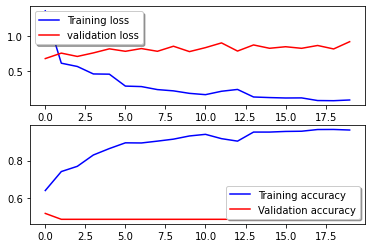

In [41]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='b', label="Training loss")
ax[0].plot(history.history['val_loss'], color='r', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='b', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='r',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

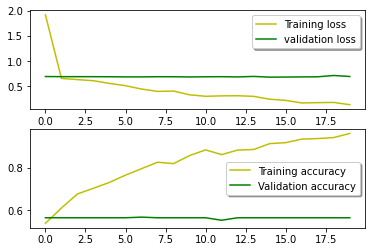

In [67]:
fig, ax = plt.subplots(2,1)
ax[0].plot(history.history['loss'], color='y', label="Training loss")
ax[0].plot(history.history['val_loss'], color='g', label="validation loss",axes =ax[0])
legend = ax[0].legend(loc='best', shadow=True)

ax[1].plot(history.history['accuracy'], color='y', label="Training accuracy")
ax[1].plot(history.history['val_accuracy'], color='g',label="Validation accuracy")
legend = ax[1].legend(loc='best', shadow=True)

In [70]:
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
   
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j],
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

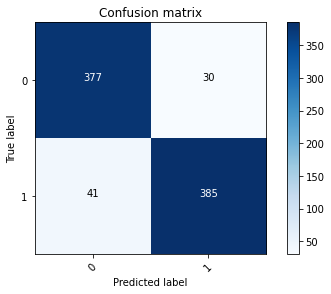

In [43]:
# Predict the values from the validation dataset
Y_pred = model.predict(X_val)
# Convert predictions classes to one hot vectors 
Y_pred_classes = np.argmax(Y_pred,axis = 1) 
# Convert validation observations to one hot vectors
Y_true = np.argmax(Y_val,axis = 1) 
# compute the confusion matrix
confusion_mtx = confusion_matrix(Y_true, Y_pred_classes) 
# plot the confusion matrix
plot_confusion_matrix(confusion_mtx, classes = range(2))

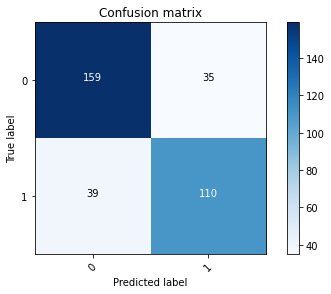

In [71]:
Y1_pred = model.predict(X1_val) 
Y1_pred_classes = np.argmax(Y1_pred,axis = 1) 
Y1_true = np.argmax(Y1_val,axis = 1) 
confusion_mtx = confusion_matrix(Y1_true, Y1_pred_classes) 
plot_confusion_matrix(confusion_mtx, classes = range(2))

In [44]:
class_names = ['fake', 'real']

In [77]:
class_names = ['fake1', 'real1']

In [45]:
real_image_path = '../input/casia-dataset/CASIA2/Au/Au_ani_00001.jpg'
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

Class: real Confidence: 100.00


In [78]:
real_image_path = '/kaggle/input/casia-dataset/CASIA1/Au/Au_ani_0003.jpg'
image = prepare_image(real_image_path)
image = image.reshape(-1, 128, 128, 3)
y1_pred = model.predict(image)
y1_pred_class = np.argmax(y1_pred, axis = 1)[0]
print(f'Class: {class_names[y1_pred_class]} Confidence: {np.amax(y1_pred) * 100:0.2f}')

Class: real1 Confidence: 100.00


In [46]:
fake_image_path = '../input/casia-dataset/CASIA2/Tp/Tp_D_NRN_S_N_ani10171_ani00001_12458.jpg'
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y_pred = model.predict(image)
y_pred_class = np.argmax(y_pred, axis = 1)[0]
print(f'Class: {class_names[y_pred_class]} Confidence: {np.amax(y_pred) * 100:0.2f}')

Class: fake Confidence: 99.14


In [79]:
fake_image_path = '/kaggle/input/casia-dataset/CASIA1/Sp/Sp_D_CNN_A_art0024_ani0032_0268.jpg'
image = prepare_image(fake_image_path)
image = image.reshape(-1, 128, 128, 3)
y1_pred = model.predict(image)
y1_pred_class = np.argmax(y1_pred, axis = 1)[0]
print(f'Class: {class_names[y1_pred_class]} Confidence: {np.amax(y1_pred) * 100:0.2f}')

Class: fake1 Confidence: 100.00


In [47]:
fake_image = os.listdir('../input/casia-dataset/CASIA2/Tp/')
correct = 0
total = 0
for file_name in fake_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join('../input/casia-dataset/CASIA2/Tp/', file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total += 1
        if y_pred_class == 0:
            correct += 1

In [80]:
fake_image = os.listdir('../input/casia-dataset/CASIA1/Sp/')
correct = 0
total = 0
for file_name in fake_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        fake_image_path = os.path.join('../input/casia-dataset/CASIA1/Sp/', file_name)
        image = prepare_image(fake_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y1_pred = model.predict(image)
        y1_pred_class = np.argmax(y1_pred, axis = 1)[0]
        total += 1
        if y1_pred_class == 0:
            correct += 1

In [48]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 2064, Correct: 2006, Acc: 97.18992248062015


In [81]:
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 921, Correct: 886, Acc: 96.19978284473399


In [49]:
real_image = os.listdir('../input/casia-dataset/CASIA2/Au/')
correct_r = 0
total_r = 0
for file_name in real_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join('../input/casia-dataset/CASIA2/Au/', file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y_pred = model.predict(image)
        y_pred_class = np.argmax(y_pred, axis = 1)[0]
        total_r += 1
        if y_pred_class == 1:
            correct_r += 1

/opt/conda/lib/python3.7/site-packages/PIL/TiffImagePlugin.py:766: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 2. Skipping tag 41487

  " Skipping tag %s" % (size, len(data), tag)

/opt/conda/lib/python3.7/site-packages/PIL/TiffImagePlugin.py:766: UserWarning: Possibly corrupt EXIF data.  Expecting to read 8 bytes but only got 0. Skipping tag 41988

  " Skipping tag %s" % (size, len(data), tag)


In [82]:
real_image = os.listdir('../input/casia-dataset/CASIA1/Au/')
correct_r = 0
total_r = 0
for file_name in real_image:
    if file_name.endswith('jpg') or filename.endswith('png'):
        real_image_path = os.path.join('../input/casia-dataset/CASIA1/Au/', file_name)
        image = prepare_image(real_image_path)
        image = image.reshape(-1, 128, 128, 3)
        y1_pred = model.predict(image)
        y1_pred_class = np.argmax(y1_pred, axis = 1)[0]
        total_r += 1
        if y1_pred_class == 1:
            correct_r += 1

In [50]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 7354, Correct: 6888, Acc: 93.66331248300244

Total: 9418, Correct: 8894, Acc: 94.43618602675727


In [83]:
correct += correct_r
total += total_r
print(f'Total: {total_r}, Correct: {correct_r}, Acc: {correct_r / total_r * 100.0}')
print(f'Total: {total}, Correct: {correct}, Acc: {correct / total * 100.0}')

Total: 790, Correct: 751, Acc: 95.0632911392405
Total: 1711, Correct: 1637, Acc: 95.6750438340152
